In [1]:
%load_ext lab_black

In [3]:
%load_ext tensorboard

In [4]:
import time
import cv2
import gym
import gym.spaces
import torch
import torch.nn as nn
import torch.optim as optim
from tensorboardX import SummaryWriter
import numpy as np
import collections

In [5]:
# 부드러운 애니메이션을 위해

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation

mpl.rc("animation", html="jshtml")

## Set Wrapper

In [15]:
class FireResetEnv(gym.Wrapper):
    def __init__(self, env: gym = None):
        super(FireResetEnv, self).__init__(env)
        assert env.unwrapped.get_action_meanings()[1] == "FIRE"
        assert len(env.unwrapped.get_action_meanings()) >= 3

    def step(self, action):
        return self.env.step(action)

    def reset(self):
        self.env.reset()
        obs, _, done, _ = self.env.step(1)
        if done:
            self.env.reset()

        obs, _, done, _ = self.env.step(2)
        if done:
            self.env.reset()
        return obs


class MaxAndSkipEnv(gym.Wrapper):
    def __init__(self, env=None, skip=4):
        """Return only every `skip`-th frame"""
        super(MaxAndSkipEnv, self).__init__(env)
        # most recent raw observations (for max pooling across time steps)
        self._obs_buffer = collections.deque(maxlen=2)
        self._skip = skip

    def step(self, action):
        total_reward = 0.0
        done = None
        for _ in range(self._skip):
            obs, reward, done, info = self.env.step(action)
            self._obs_buffer.append(obs)
            total_reward += reward
            if done:
                break
        max_frame = np.max(np.stack(self._obs_buffer), axis=0)
        return max_frame, total_reward, done, info

    def reset(self):
        """Clear past frame buffer and init. to first obs. from inner env."""
        self._obs_buffer.clear()
        obs = self.env.reset()
        self._obs_buffer.append(obs)
        return obs


class ProcessFrame84(gym.ObservationWrapper):
    def __init__(self, env=None):
        super(ProcessFrame84, self).__init__(env)
        self.observation_space = gym.spaces.Box(
            low=0, high=255, shape=(84, 84, 1), dtype=np.uint8
        )

    def observation(self, obs):
        return ProcessFrame84.process(obs)

    @staticmethod
    def process(frame):
        if frame.size == 210 * 160 * 3:
            img = np.reshape(frame, [210, 160, 3]).astype(np.float32)
        elif frame.size == 250 * 160 * 3:
            img = np.reshape(frame, [250, 160, 3]).astype(np.float32)
        else:
            assert False, "Unknown resolution."
        img = img[:, :, 0] * 0.299 + img[:, :, 1] * 0.587 + img[:, :, 2] * 0.114
        resized_screen = cv2.resize(img, (84, 110), interpolation=cv2.INTER_AREA)
        x_t = resized_screen[18:102, :]
        x_t = np.reshape(x_t, [84, 84, 1])
        return x_t.astype(np.uint8)


class ImageToPyTorch(gym.ObservationWrapper):
    def __init__(self, env):
        super(ImageToPyTorch, self).__init__(env)
        old_shape = self.observation_space.shape
        new_shape = (old_shape[-1], old_shape[0], old_shape[1])
        self.observation_space = gym.spaces.Box(
            low=0.0, high=1.0, shape=new_shape, dtype=np.float32
        )

    def observation(self, observation):
        return np.moveaxis(observation, 2, 0)


class ScaledFloatFrame(gym.ObservationWrapper):
    def observation(self, obs):
        return np.array(obs).astype(np.float32) / 255.0


class BufferWrapper(gym.ObservationWrapper):
    def __init__(self, env, n_steps, dtype=np.float32):
        super(BufferWrapper, self).__init__(env)
        self.dtype = dtype
        old_space = env.observation_space
        self.observation_space = gym.spaces.Box(
            old_space.low.repeat(n_steps, axis=0),
            old_space.high.repeat(n_steps, axis=0),
            dtype=dtype,
        )

    def reset(self):
        self.buffer = np.zeros_like(self.observation_space.low, dtype=self.dtype)
        return self.observation(self.env.reset())

    def observation(self, observation):
        self.buffer[:-1] = self.buffer[1:]
        self.buffer[-1] = observation
        return self.buffer


def make_env(env_name):
    env = gym.make(env_name)
    env = MaxAndSkipEnv(env)
    env = FireResetEnv(env)
    env = ProcessFrame84(env)
    env = ImageToPyTorch(env)
    env = BufferWrapper(env, 4)
    return ScaledFloatFrame(env)

## Set Model

In [4]:
# Test
m = nn.Conv2d(16, 33, kernel_size=3, stride=2)
input = torch.randn(20, 16, 50, 100)
output = m(input)

In [5]:
output.shape

torch.Size([20, 33, 24, 49])

In [6]:
# Test torch.view
x = torch.randn(4, 4)
y = x.view(16)
print(y.shape)

torch.Size([16])


In [20]:
class DQN(nn.Module):
    def __init__(self, input_shape, n_actions):
        super(DQN, self).__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(input_shape[0], 32, kernel_size=8, stride=4),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1),
            nn.ReLU(),
        )

        conv_out_size = self._get_conv_out(input_shape)
        self.fc = nn.Sequential(
            nn.Linear(conv_out_size, 512), nn.ReLU(), nn.Linear(512, n_actions)
        )

    def _get_conv_out(self, shape):
        o = self.conv(torch.zeros(1, *shape))
        return int(np.prod(o.size()))

    def forward(self, x):
        conv_out = self.conv(x).view(x.size()[0], -1)
        return self.fc(conv_out)

## Set Hyper Parameter

In [8]:
DEFAULT_ENV_NAME = "PongNoFrameskip-v4"
MEAN_REWARD_BOUND = 19

GAMMA = 0.99
BATCH_SIZE = 32
REPLAY_SIZE = 10000
LEARNING_RATE = 1e-4
SYNC_TARGET_FRAMES = 1000
REPLAY_START_SIZE = 10000

EPSILON_DECAY_LAST_FRAME = 150000
EPSILON_START = 1.0
EPSILON_FINAL = 0.01

In [9]:
Experience = collections.namedtuple(
    "Experience", field_names=["state", "action", "reward", "done", "new_state"]
)

## Set Buffer Class

In [10]:
class ExperienceBuffer:
    def __init__(self, capacity):
        self.buffer = collections.deque(maxlen=capacity)

    def __len__(self):
        return len(self.buffer)

    def append(self, experience):
        self.buffer.append(experience)

    def sample(self, batch_size):
        indices = np.random.choice(len(self.buffer), batch_size, replace=False)
        states, actions, rewards, dones, next_states = zip(
            *[self.buffer[idx] for idx in indices]
        )
        return (
            np.array(states),
            np.array(actions),
            np.array(rewards, dtype=np.float32),
            np.array(dones, dtype=np.uint8),
            np.array(next_states),
        )

## Set Agent

In [28]:
class Agent:
    def __init__(self, env, exp_buffer):
        self.env = env
        self.exp_buffer = exp_buffer
        self._reset()

    def _reset(self):
        self.state = env.reset()
        self.total_reward = 0.0

    @torch.no_grad()
    def play_step(self, net, epsilon=0.0, device="cpu"):
        done_reward = None

        if np.random.random() < epsilon:
            action = env.action_space.sample()
        else:
            state_a = np.array([self.state], copy=False)
            state_v = torch.tensor(state_a).to(device)
            q_vals_v = net(state_v)
            _, act_v = torch.max(q_vals_v, dim=1)
            action = int(act_v.item())

        # do step in the environment
        new_state, reward, is_done, _ = self.env.step(action)
        self.total_reward += reward

        exp = Experience(self.state, action, reward, is_done, new_state)
        self.exp_buffer.append(exp)
        self.state = new_state
        if is_done:
            done_reward = self.total_reward
            self._reset()
        return done_reward

In [30]:
# squeeze and unsqueeze test
a = torch.randn(4, 4)
b = a.unsqueeze(-1)
print(b.shape)
print(b.squeeze(-1).shape)

torch.Size([4, 4, 1])
torch.Size([4, 4])


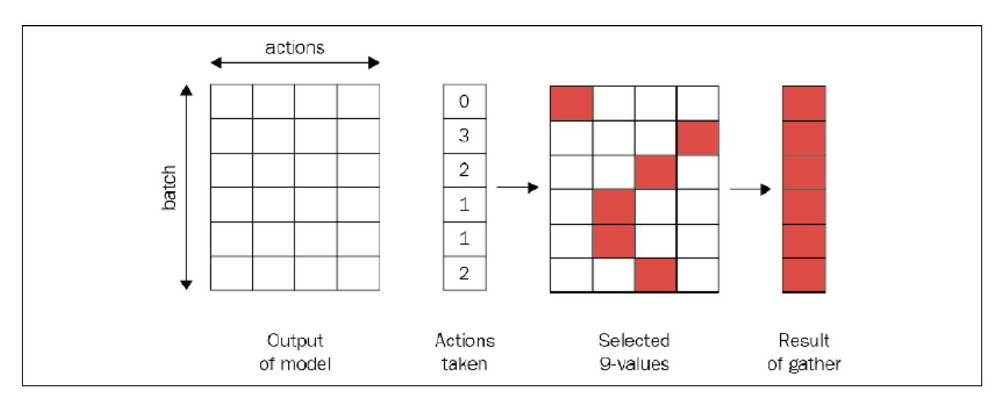

In [9]:
# torch gather test
t = torch.tensor([[1, 2], [3, 4]])
print(t)
t_ = torch.gather(t, dim=1, index=torch.tensor([[0, 0], [1, 0]]))
print(t_)

tensor([[1, 2],
        [3, 4]])
tensor([[1, 1],
        [4, 3]])


In [29]:
matrix = torch.range(0, 99).reshape(10, 10)
indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
indices = torch.tensor(indices).unsqueeze(axis=-1)
print("Matrix")
print(matrix)
print("Index")
# 첫번째 Row에 0번째 index
# 두번째 Row에 1번쨰 index
print(indices)
print("Gather")
print(torch.gather(matrix, dim=1, index=indices))

Matrix
tensor([[ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9.],
        [10., 11., 12., 13., 14., 15., 16., 17., 18., 19.],
        [20., 21., 22., 23., 24., 25., 26., 27., 28., 29.],
        [30., 31., 32., 33., 34., 35., 36., 37., 38., 39.],
        [40., 41., 42., 43., 44., 45., 46., 47., 48., 49.],
        [50., 51., 52., 53., 54., 55., 56., 57., 58., 59.],
        [60., 61., 62., 63., 64., 65., 66., 67., 68., 69.],
        [70., 71., 72., 73., 74., 75., 76., 77., 78., 79.],
        [80., 81., 82., 83., 84., 85., 86., 87., 88., 89.],
        [90., 91., 92., 93., 94., 95., 96., 97., 98., 99.]])
Index
tensor([[0],
        [1],
        [2],
        [3],
        [4],
        [5],
        [6],
        [7],
        [8],
        [9]])
Gather
tensor([[ 0.],
        [11.],
        [22.],
        [33.],
        [44.],
        [55.],
        [66.],
        [77.],
        [88.],
        [99.]])


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: torch.range is deprecated and will be removed in a future release because its behavior is inconsistent with Python's range builtin. Instead, use torch.arange, which produces values in [start, end).
  """Entry point for launching an IPython kernel.


### detach()와 clone()은 기존 Tensor를 복사하는 방법 중 하나입니다.

detach() : 기존 Tensor에서 gradient 전파가 안되는 텐서 생성
단 storage를 공유하기에 detach로 생성한 Tensor가 변경되면 원본 Tensor도 똑같이 변합니다.


clone() : 기존 Tensor와 내용을 복사한 텐서 생성

In [32]:
a = torch.tensor([1, 2])
b = a.detach()
print(b)

tensor([1, 2])


In [32]:
def calc_loss(batch, net, tgt_net, device="cpu"):
    states, actions, rewards, dones, next_states = batch

    states_v = torch.tensor(np.array(states, copy=False)).to(device)
    next_states_v = torch.tensor(np.array(next_states, copy=False)).to(device)
    actions_v = torch.tensor(actions).to(device)
    rewards_v = torch.tensor(rewards).to(device)
    done_mask = torch.BoolTensor(dones).to(device)

    state_action_values = net(states_v).gather(1, actions_v.unsqueeze(-1)).squeeze(-1)
    with torch.no_grad():
        next_state_values = tgt_net(next_states_v).max(1)[0]
        next_state_values[done_mask] = 0.0
        next_state_values = next_state_values.detach()

    expected_state_action_values = next_state_values * GAMMA + rewards_v
    return nn.MSELoss()(state_action_values, expected_state_action_values)

In [33]:
if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    env = make_env(DEFAULT_ENV_NAME)

    net = DQN(env.observation_space.shape, env.action_space.n).to(device)
    tgt_net = DQN(env.observation_space.shape, env.action_space.n).to(device)
    writer = SummaryWriter(comment="-" + DEFAULT_ENV_NAME)
    print(net)

    buffer = ExperienceBuffer(REPLAY_SIZE)
    agent = Agent(env, buffer)
    epsilon = EPSILON_START

    optimizer = optim.Adam(net.parameters(), lr=LEARNING_RATE)
    total_rewards = []
    frame_idx = 0
    ts_frame = 0
    ts = time.time()
    best_m_reward = None

    while True:
        frame_idx += 1
        epsilon = max(
            EPSILON_FINAL, EPSILON_START - frame_idx / EPSILON_DECAY_LAST_FRAME
        )

        reward = agent.play_step(net, epsilon, device=device)
        if reward is not None:
            total_rewards.append(reward)
            speed = (frame_idx - ts_frame) / (time.time() - ts)
            ts_frame = frame_idx
            ts = time.time()
            m_reward = np.mean(total_rewards[-100:])
            print(
                "%d: done %d games, reward %.3f, "
                "eps %.2f, speed %.2f f/s"
                % (frame_idx, len(total_rewards), m_reward, epsilon, speed)
            )
            writer.add_scalar("epsilon", epsilon, frame_idx)
            writer.add_scalar("speed", speed, frame_idx)
            writer.add_scalar("reward_100", m_reward, frame_idx)
            writer.add_scalar("reward", reward, frame_idx)
            if best_m_reward is None or best_m_reward < m_reward:
                torch.save(
                    net.state_dict(), DEFAULT_ENV_NAME + "-best_%.0f.dat" % m_reward
                )
                if best_m_reward is not None:
                    print(
                        "Best reward updated %.3f -> %.3f" % (best_m_reward, m_reward)
                    )
                best_m_reward = m_reward
            if m_reward > MEAN_REWARD_BOUND:
                print("Solved in %d frames!" % frame_idx)
                break

        if len(buffer) < REPLAY_START_SIZE:
            continue

        if frame_idx % SYNC_TARGET_FRAMES == 0:
            tgt_net.load_state_dict(net.state_dict())

        optimizer.zero_grad()
        batch = buffer.sample(BATCH_SIZE)
        loss_t = calc_loss(batch, net, tgt_net, device=device)
        loss_t.backward()
        optimizer.step()
    writer.close()

DQN(
  (conv): Sequential(
    (0): Conv2d(4, 32, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
    (3): ReLU()
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (5): ReLU()
  )
  (fc): Sequential(
    (0): Linear(in_features=3136, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=6, bias=True)
  )
)
838: done 1 games, reward -21.000, eps 0.99, speed 490.39 f/s
1686: done 2 games, reward -21.000, eps 0.99, speed 466.54 f/s
2467: done 3 games, reward -21.000, eps 0.98, speed 493.77 f/s
3396: done 4 games, reward -20.750, eps 0.98, speed 495.17 f/s
Best reward updated -21.000 -> -20.750
4435: done 5 games, reward -20.600, eps 0.97, speed 474.16 f/s
Best reward updated -20.750 -> -20.600
5275: done 6 games, reward -20.500, eps 0.96, speed 468.84 f/s
Best reward updated -20.600 -> -20.500
6162: done 7 games, reward -20.571, eps 0.96, speed 467.99 f/s
7002: done 8 games, rew

In [37]:
%tensorboard --host 0.0.0.0 --port 6006 --logdir=runs

In [ ]:
class Agent:
    def __init__(self, env, exp_buffer):
        self.env = env
        self.exp_buffer = exp_buffer
        self._reset()

    def _reset(self):
        self.state = env.reset()
        self.total_reward = 0.0

    @torch.no_grad()
    def play_step(self, net, epsilon=0.0, device="cpu"):
        done_reward = None

        if np.random.random() < epsilon:
            action = env.action_space.sample()
        else:
            state_a = np.array([self.state], copy=False)
            state_v = torch.tensor(state_a).to(device)
            q_vals_v = net(state_v)
            _, act_v = torch.max(q_vals_v, dim=1)
            action = int(act_v.item())

        # do step in the environment
        new_state, reward, is_done, _ = self.env.step(action)
        self.total_reward += reward

        exp = Experience(self.state, action, reward, is_done, new_state)
        self.exp_buffer.append(exp)
        self.state = new_state
        if is_done:
            done_reward = self.total_reward
            self._reset()
        return done_reward

## Display Result

In [61]:
try:
    import pyvirtualdisplay

    display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()
except ImportError:
    pass

In [62]:
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return (patch,)


def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis("off")
    anim = animation.FuncAnimation(
        fig,
        update_scene,
        fargs=(frames, patch),
        frames=len(frames),
        repeat=repeat,
        interval=interval,
    )
    plt.close()
    return anim

In [64]:
state = env.reset()
total_reward = 0
frames = list()

while True:
    state_a = np.array([state], copy=False)
    state_v = torch.tensor(state_a).to(device)
    q_vals_v = net(state_v)
    _, act_v = torch.max(q_vals_v, dim=1)
    action = int(act_v.item())

    # do step in the environment
    new_state, reward, is_done, _ = env.step(action)
    total_reward += reward
    frames.append(np.transpose(state, (1, 2, 0)))

    state = new_state
    if is_done:
        print(f"Reward: {total_reward}")
        break

Reward: 21.0


In [68]:
plot_animation(frames)